## Load Dataset

In [2]:
# Intstall Requirements
!pip install git+https://github.com/cocodataset/panopticapi.git

  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-req-build-npb22afi
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/panopticapi.git /tmp/pip-req-build-npb22afi
  Resolved https://github.com/cocodataset/panopticapi.git to commit 7bb4655548f98f3fedc07bf37e9040a992b054b0
  Preparing metadata (setup.py) ... done
  Created wheel for panopticapi: filename=panopticapi-0.1-py3-none-any.whl size=8258 sha256=7d0d8c5dfb71a89cfabf120d14456b6b6008cce1218bbb1ca1c4bd374c50368c
  Stored in directory: /tmp/pip-ephem-wheel-cache-hrbjjpxk/wheels/70/87/ae/5c2b138c967549070e3fe35f3b5fcaf1ed56e9f5483a09ee65
Successfully built panopticapi


In [3]:
# Import libraries
import zipfile
import json
import numpy as np
import cv2
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt
from panopticapi.utils import rgb2id, IdGenerator
from google.colab.patches import cv2_imshow
np.random.seed(24) # Set random seed for reproducibility

In [ ]:
# Download Dataset
!curl -O http://images.cocodataset.org/zips/train2017.zip
!curl -O http://images.cocodataset.org/zips/val2017.zip
!curl -O http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!curl -O http://images.cocodataset.org/annotations/panoptic_annotations_trainval2017.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
 92 18.0G   92 16.6G    0     0  19.8M      0  0:15:28  0:14:17  0:01:11 18.7M

In [4]:
# Extract image and annotation files
def unzip(filePath, extractPath):
  with zipfile.ZipFile(filePath, 'r') as zip_ref:
      zip_ref.extractall(extractPath)
unzip('train2017.zip', './coco/images')
unzip('val2017.zip', './coco/images')
unzip('annotations_trainval2017.zip', './coco')
unzip('panoptic_annotations_trainval2017.zip', './coco')
unzip('./coco/annotations/panoptic_val2017.zip', './coco/annotations')
unzip('./coco/annotations/panoptic_train2017.zip', './coco/annotations')

In [ ]:
# View Sample Annotation Data
with open('coco/annotations/panoptic_train2017.json', 'r') as f:
       train_segments = json.load(f)
with open('coco/annotations/instances_train2017.json', 'r') as f:
       train_instances = json.load(f)
with open('coco/annotations/panoptic_train2017.json', 'r') as f:
       val_segments = json.load(f)

# Print first annotation to see the structure
print('Total Images:', len(train_segments['images']))
print('Total Segments:', len(train_segments['annotations']))
print('Total Instances:', len(train_segments['annotations']))
print(train_segments['annotations'][0])
print(train_instances['annotations'][0])

In [79]:
from tqdm import tqdm

# Take Subset of Training Data
num_samples = 10000

# Extract a subset random images with their corresponding annotations
train_segments_subset = train_segments.copy()
train_instances_subset = train_instances.copy()

np.random.shuffle(train_segments_subset['images'])
train_segments_subset['images'] = train_segments_subset['images'][:num_samples]
train_image_file_names = [image['file_name'] for image in train_segments_subset['images']]
panoptic_image_file_names = [x.replace('.jpg', '.png') for x in train_image_file_names]
image_ids = [image['id'] for image in train_segments_subset['images']]

train_segments_subset['annotations'] = [x for x in tqdm(train_segments_subset['annotations'], position=0, leave=True, desc='Processing Segment Annotations') if x['image_id'] in image_ids]
train_instances_subset['images'] = [x for x in tqdm(train_instances_subset['images'], position=0, leave=True, desc='Processing Instance Images') if x['id'] in image_ids]
train_instances_subset['annotations'] = [x for x in tqdm(train_instances_subset['annotations'], position=0, leave=True, desc='Processing Instance Annotations') if x['image_id'] in image_ids]

print('\nTotal Subset Train Images/Annotations:', len(train_segments_subset['images']))
print('Total Subset Train Instances Images/Annotations:', len(train_instances_subset['images']))

Total Images: 118287
Total Annotations: 118287
{'segments_info': [{'id': 8345037, 'category_id': 51, 'iscrowd': 0, 'bbox': [0, 14, 434, 374], 'area': 24315}, {'id': 6968006, 'category_id': 51, 'iscrowd': 0, 'bbox': [312, 4, 319, 229], 'area': 34234}, {'id': 2005197, 'category_id': 51, 'iscrowd': 0, 'bbox': [1, 189, 612, 285], 'area': 70036}, {'id': 3658235, 'category_id': 55, 'iscrowd': 0, 'bbox': [387, 74, 83, 70], 'area': 3566}, {'id': 2803959, 'category_id': 55, 'iscrowd': 0, 'bbox': [376, 40, 76, 47], 'area': 2241}, {'id': 2992357, 'category_id': 55, 'iscrowd': 0, 'bbox': [364, 2, 94, 71], 'area': 2963}, {'id': 2271460, 'category_id': 55, 'iscrowd': 0, 'bbox': [466, 39, 58, 46], 'area': 1660}, {'id': 1720367, 'category_id': 56, 'iscrowd': 0, 'bbox': [250, 229, 316, 245], 'area': 49529}, {'id': 8922372, 'category_id': 189, 'iscrowd': 0, 'bbox': [0, 0, 319, 118], 'area': 17245}, {'id': 7113394, 'category_id': 196, 'iscrowd': 0, 'bbox': [0, 11, 640, 469], 'area': 84156}], 'file_name':

Processing Instance Annotations: 100%|██████████| 860001/860001 [20:00<00:00, 716.48it/s]

Total Subset Train Images/Annotations: 50000
Total Subset Train Instances Images/Annotations: 50000


In [111]:
# Make Directories for Subset Images
!mkdir coco/images/train2017_sub
!mkdir coco/annotations/panoptic_train2017_sub

In [112]:
# Create Subset Data Files
import os
import shutil
import json

def create_subset_image_files(source_dir, dest_dir, condition):
  p_bar = tqdm(range(num_samples), position=0,
               leave=True, desc='Filtering Images... ')
  for filename in os.listdir(source_dir):
      file_path = os.path.join(source_dir, filename)

      if os.path.isfile(file_path) and condition(filename):
          shutil.copy(file_path, dest_dir)
          p_bar.update(1)

# Filter Train Image Files
print('Processing Train Image Files...')
create_subset_image_files('coco/images/train2017/',
                      'coco/images/train2017_sub/',
                      lambda filename: filename in train_image_file_names)
# Filter Train Panoptic Image Files
print('Processing Panoptic Train Image Files...')
create_subset_image_files('coco/annotations/panoptic_train2017/',
                      'coco/annotations/panoptic_train2017_sub/',
                      lambda filename: filename in panoptic_image_file_names)

# Create Filtered Segment Annotations
with open('coco/annotations/panoptic_train2017_sub.json', 'w', encoding="utf-8") as f:
  print('Creating Segment Annotation File...')
  json.dump(train_segments_subset, f)
  print('Segment Annotation File Created:', 'coco/annotations/panoptic_train2017_sub.json')

# Create Filtered Instance Annotations
with open('coco/annotations/instances_train2017_sub.json', 'w', encoding="utf-8") as f:
  print('Creating Instance Annotation File...')
  json.dump(train_instances_subset, f)
  print('Segment Annotation File Created:', 'coco/annotations/instances_train2017_sub.json')

Processing Train Image Files...


Filtering Images... : 100%|██████████| 50000/50000 [12:32<00:00, 66.47it/s]


Processing Panoptic Train Image Files...


Filtering Images... : 100%|██████████| 50000/50000 [03:32<00:00, 235.61it/s]


Creating Segment Annotation File...
Segment Annotation File Created: coco/annotations/panoptic_train2017_sub.json
Creating Instance Annotation File...
Segment Annotation File Created: coco/annotations/instances_train2017_sub.json


In [5]:
# Download panoptic api converter source files
!wget https://raw.githubusercontent.com/cocodataset/panopticapi/master/panoptic_coco_categories.json
!wget https://raw.githubusercontent.com/cocodataset/panopticapi/master/converters/panoptic2semantic_segmentation.py

--2024-12-01 04:46:34--  https://raw.githubusercontent.com/cocodataset/panopticapi/master/panoptic_coco_categories.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13159 (13K) [text/plain]
Saving to: ‘panoptic_coco_categories.json’

panoptic_coco_categ 100%[===================>]  12.85K  --.-KB/s    in 0.001s  

2024-12-01 04:46:34 (21.0 MB/s) - ‘panoptic_coco_categories.json’ saved [13159/13159]

--2024-12-01 04:46:34--  https://raw.githubusercontent.com/cocodataset/panopticapi/master/converters/panoptic2semantic_segmentation.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTT

In [114]:
# Convert panoptic to semantic annotations for subset train data
!python panoptic2semantic_segmentation.py \
  --input_json_file coco/annotations/panoptic_train2017_sub.json \
  --semantic_seg_folder coco/annotations/panoptic_stuff_train2017

EXTRACTING FROM...
COCO panoptic format:
	Segmentation folder: coco/annotations/panoptic_train2017_sub
	JSON file: coco/annotations/panoptic_train2017_sub.json
SEMANTIC SEGMENTATION
in PNG format:
	Folder with semnatic segmentations: coco/annotations/panoptic_stuff_train2017
Creating folder coco/annotations/panoptic_stuff_train2017 for semantic segmentation PNGs


Number of cores: 8, images per core: 6250
Core: 0, 0 from 6250 images processed
Core: 1, 0 from 6250 images processed
Core: 2, 0 from 6250 images processed
Core: 3, 0 from 6250 images processed
Core: 4, 0 from 6250 images processed
Core: 5, 0 from 6250 images processed
Core: 6, 0 from 6250 images processed
Core: 7, 0 from 6250 images processed
Core: 0, 100 from 6250 images processed
Core: 3, 100 from 6250 images processed
Core: 1, 100 from 6250 images processed
Core: 2, 100 from 6250 images processed
Core: 4, 100 from 6250 images processed
Core: 5, 100 from 6250 images processed
Core: 6, 100 from 6250 images processed
Core: 7

In [7]:
# Convert panoptic to semantic annotations for val data
!python panoptic2semantic_segmentation.py \
  --input_json_file coco/annotations/panoptic_val2017.json \
  --semantic_seg_folder coco/annotations/panoptic_stuff_val2017

EXTRACTING FROM...
COCO panoptic format:
	Segmentation folder: coco/annotations/panoptic_val2017
	JSON file: coco/annotations/panoptic_val2017.json
SEMANTIC SEGMENTATION
in PNG format:
	Folder with semnatic segmentations: coco/annotations/panoptic_stuff_val2017
Creating folder coco/annotations/panoptic_stuff_val2017 for semantic segmentation PNGs


Number of cores: 8, images per core: 625
Core: 0, 0 from 625 images processed
Core: 1, 0 from 625 images processed
Core: 2, 0 from 625 images processed
Core: 3, 0 from 625 images processed
Core: 4, 0 from 625 images processed
Core: 5, 0 from 625 images processed
Core: 6, 0 from 625 images processed
Core: 7, 0 from 625 images processed
Core: 0, 100 from 625 images processed
Core: 2, 100 from 625 images processed
Core: 3, 100 from 625 images processed
Core: 1, 100 from 625 images processed
Core: 4, 100 from 625 images processed
Core: 7, 100 from 625 images processed
Core: 5, 100 from 625 images processed
Core: 6, 100 from 625 images processed


## Explore Dataset

In [122]:
image_ids[:6]

[556660, 376531, 425582, 306288, 55202, 91006]

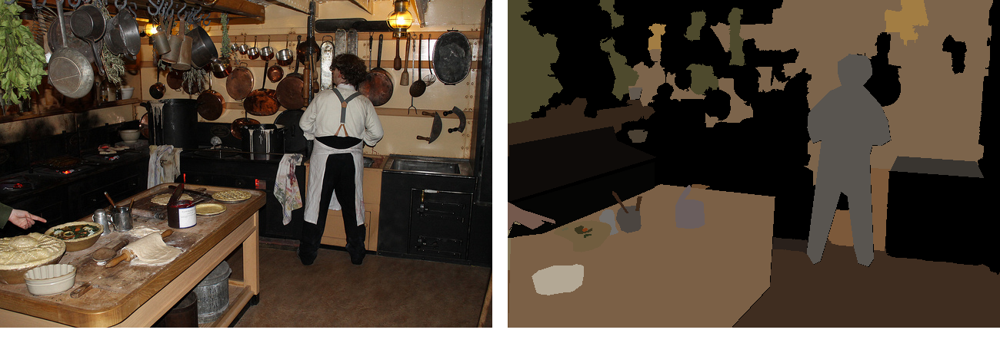

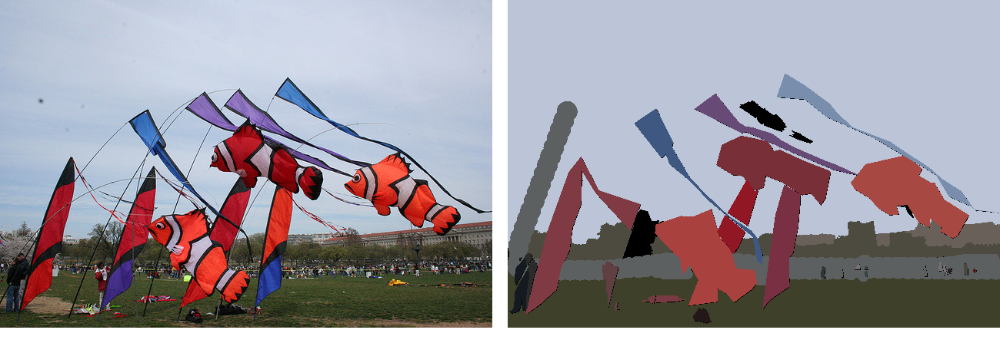

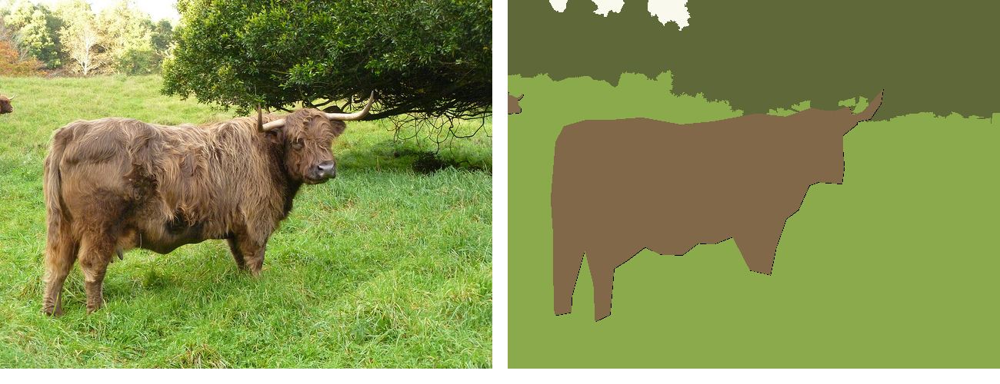

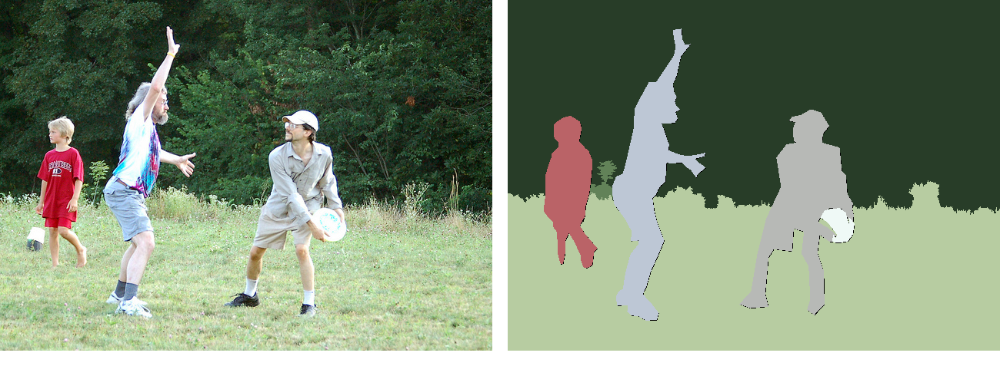

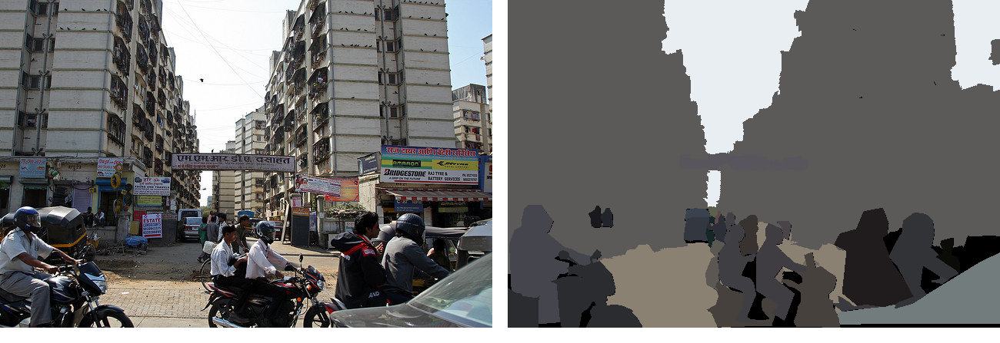

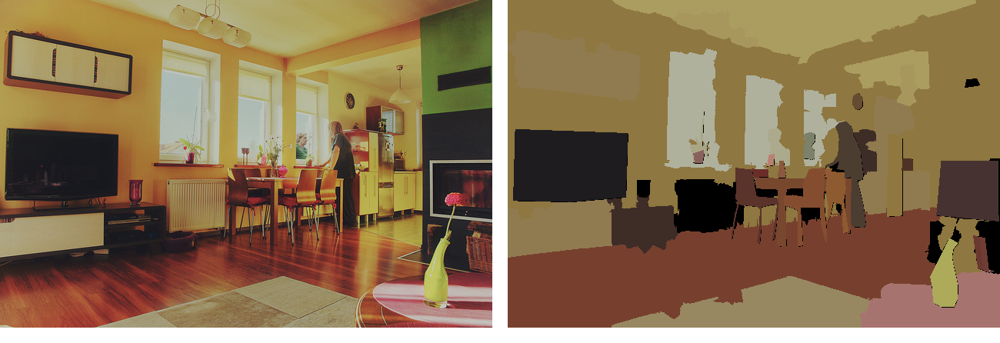

In [128]:
# Visualize Examples
def visualize_example(image_id):
  image_info = [img for img in val_segments['images'] if img['id'] == image_id][0]
  panoptic_ann = [ann for ann in val_segments['annotations'] if ann['image_id'] == image_id][0]

  # Load the image
  image_info_path = 'coco/images/val2017/' + image_info['file_name']
  image_panoptic_path = 'coco/annotations/panoptic_val2017/' + panoptic_ann['file_name']

  # Visualize the image and segmentation
  img_info = cv2.imread(image_info_path)
  img_panoptic = cv2.imread(image_panoptic_path)
  spacer = np.ones((img_info.shape[0], 20, 3), dtype=np.uint8) * 255 # white space

  # Concatenate the images horizontally
  combined_image = cv2.hconcat([img_info, spacer, img_panoptic])
  combined_image = np.vstack((combined_image, np.ones((20, combined_image.shape[1], 3), dtype=np.uint8) * 255)) # white space below

  # Display the combined image
  cv2_imshow(combined_image)

# Visualize some sample images and segmentations
visualize_example(397133)
visualize_example(17959)
visualize_example(518213)
visualize_example(442836)
visualize_example(296649)
visualize_example(139)

Total supercategories: 27


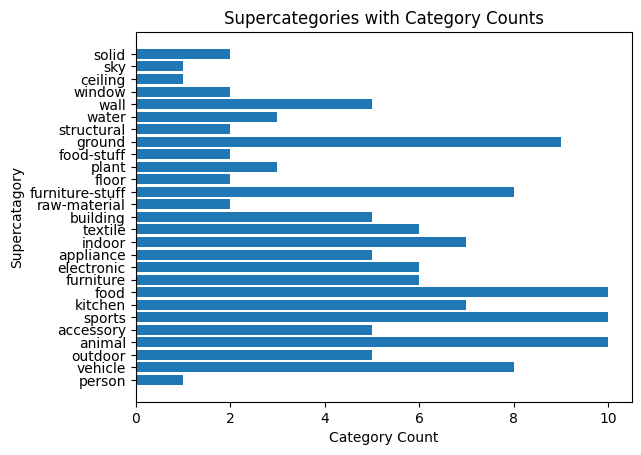

In [129]:
# Plot Supercategories with Category Counts
supercategories = [category['supercategory'] for category in train_segments['categories']]
supercategories_counts = Counter(supercategories)
print('Total supercategories:', len(supercategories_counts))
plt.title('Supercategories with Category Counts')
plt.xlabel('Category Count')
plt.ylabel('Supercatagory')
plt.barh(list(supercategories_counts.keys()), supercategories_counts.values())
plt.show()

In [130]:
# Load COCO categories
with open('panoptic_coco_categories.json', 'r') as f:
    categories_list = json.load(f)

# Create a dictionary to map category IDs to names
thing_classes = [k for k in categories_list if k["isthing"] == 1]
stuff_classes = [k for k in categories_list if k["isthing"] == 0]

# Plot Thing and Stuff Classes
print('Total Categories:', len(categories_list))
print('Total Thing Classes:', len(thing_classes), thing_classes)
print('Total Stuff Classes:', len(stuff_classes), stuff_classes)

Total Categories: 133
Total Thing Classes: 80 [{'supercategory': 'person', 'color': [220, 20, 60], 'isthing': 1, 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'color': [119, 11, 32], 'isthing': 1, 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'color': [0, 0, 142], 'isthing': 1, 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'color': [0, 0, 230], 'isthing': 1, 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'color': [106, 0, 228], 'isthing': 1, 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'color': [0, 60, 100], 'isthing': 1, 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'color': [0, 80, 100], 'isthing': 1, 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'color': [0, 0, 70], 'isthing': 1, 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'color': [0, 0, 192], 'isthing': 1, 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'color': [250, 170, 30], 'isthing': 1, 'id': 10, 'name': 'traffic light'}, {'superca

## Model Training

In [12]:
!python -m pip install pyyaml==5.1
!git clone 'https://github.com/apmalinsky/detectron2_panoptic.git'
import sys, os, distutils.core
dist = distutils.core.run_setup("./detectron2_panoptic/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2_panoptic'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2_panoptic'...
remote: Enumerating objects: 15803, done.
remote: Counting objects: 100% (161/161), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 15803 (delta 85), reused 117 (delta 60), pack-reused 15642 (from 1)
Receiving objects: 100% (15803/15803), 6.42 MiB | 18.58 MiB/s, done.
Resolving deltas: 100% (11521/11521), done.


No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'


Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 35.3 MB/s eta 0:00:00
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61396 sha256=08863761aa22400820c824a863aa5a924669fa79d03ff4c17915dddd4961eeea
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7362489dd0
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-

In [13]:
import torch, detectron2
!nvcc --version  # Check the CUDA version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.5 ; cuda:  cu121
detectron2: 0.6


In [14]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Get Metadata for Panoptic Separated Datasets
keys_to_remove = ['name', 'image_root', 'panoptic_root', 'panoptic_json',
                  'sem_seg_root', 'json_file', 'evaluator_type', 'ignore_label']
metadata_train = vars(MetadataCatalog.get('coco_2017_train_panoptic_separated'))
metadata_train = {k: v for k, v in metadata_train.items() if k not in keys_to_remove}
metadata_val = vars(MetadataCatalog.get('coco_2017_val_panoptic_separated'))
metadata_val = {k: v for k, v in metadata_val.items() if k not in keys_to_remove}

In [147]:
from detectron2.data.datasets import register_coco_panoptic_separated

# Register COCO panoptic segmentation datasets
register_coco_panoptic_separated(
    name="coco_train_panoptic",
    metadata=metadata_train,
    image_root="coco/images/train2017_sub",
    panoptic_root="coco/annotations/panoptic_train2017_sub",
    panoptic_json="coco/annotations/panoptic_train2017_sub.json",
    sem_seg_root='coco/annotations/panoptic_stuff_train2017', # directory which contains all the ground truth segmentation annotations.
    instances_json='coco/annotations/instances_train2017_sub.json' # path to the json instance annotation file
)

register_coco_panoptic_separated(
    name="coco_val_panoptic",
    metadata=metadata_val,
    image_root="coco/images/val2017",
    panoptic_root="coco/annotations/panoptic_val2017",
    panoptic_json="coco/annotations/panoptic_val2017.json",
    sem_seg_root='coco/annotations/panoptic_stuff_val2017', # directory which contains all the ground truth segmentation annotations.
    instances_json='coco/annotations/instances_val2017.json' # path to the json instance annotation file
)

In [157]:
# Load Pre-trained Model
import os
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2 import model_zoo

# Initialize the configuration
cfg = get_cfg()
config_file = "COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml"

# Load a pre-trained model configuration from the model zoo
cfg.merge_from_file(model_zoo.get_config_file(config_file))

# Set the number of classes for thing classes (COCO has 133)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 133
# Set the number of classes for stuff classes (COCO has 200, id 0-200)
cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = 201

# Specify the dataset names for training and validation
cfg.DATASETS.TRAIN = ("coco_train_panoptic_separated")
cfg.DATASETS.TEST = ("coco_val_panoptic_separated")

# Set the model checkpoint directory and device
cfg.OUTPUT_DIR = "./output"
# cfg.MODEL.DEVICE = "cpu"  # Using CPU for training
cfg.MODEL.DEVICE = "cuda"  # Using GPU for training

# Define solver parameters
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.STEPS = [7000, 9000]
cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.IMS_PER_BATCH = 2

# Load the pre-trained weights
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config_file)

# Ensure the output directory exists
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

[12/01 17:16:31 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_50_3x/139514569/model_final_c10459.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


CATEGORY_IDX: 121 Metadata(name='coco_val_panoptic_separated', panoptic_root='coco/annotations/panoptic_val2017', image_root='coco/images/val2017', panoptic_json='coco/annotations/panoptic_val2017.json', sem_seg_root='coco/annotations/panoptic_stuff_val2017', json_file='coco/annotations/instances_val2017.json', evaluator_type='coco_panoptic_seg', ignore_label=255, stuff_dataset_id_to_contiguous_id={92: 1, 93: 2, 95: 3, 100: 4, 107: 5, 109: 6, 112: 7, 118: 8, 119: 9, 122: 10, 125: 11, 128: 12, 130: 13, 133: 14, 138: 15, 141: 16, 144: 17, 145: 18, 147: 19, 148: 20, 149: 21, 151: 22, 154: 23, 155: 24, 156: 25, 159: 26, 161: 27, 166: 28, 168: 29, 171: 30, 175: 31, 176: 32, 177: 33, 178: 34, 180: 35, 181: 36, 184: 37, 185: 38, 186: 39, 187: 40, 188: 41, 189: 42, 190: 43, 191: 44, 192: 45, 193: 46, 194: 47, 195: 48, 196: 49, 197: 50, 198: 51, 199: 52, 200: 53, 0: 0}, stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower

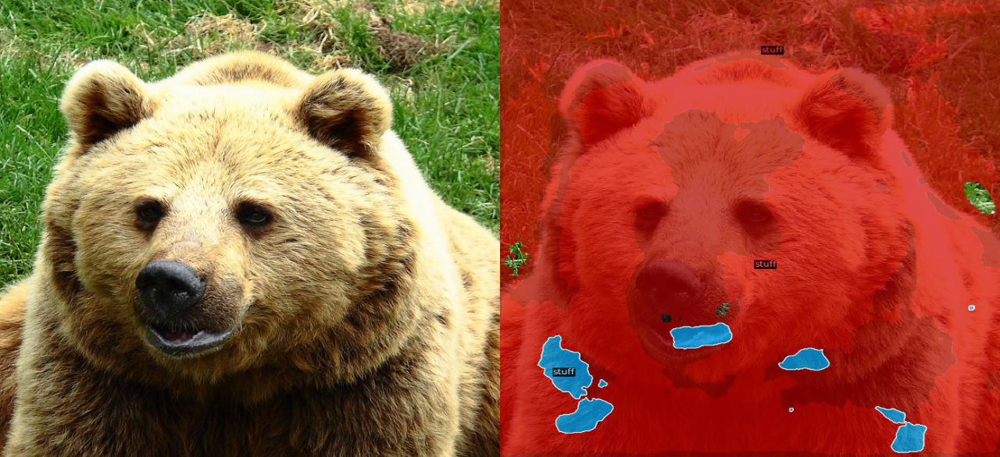

[12/01 17:16:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_50_3x/139514569/model_final_c10459.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


CATEGORY_IDX: 93 Metadata(name='coco_val_panoptic_separated', panoptic_root='coco/annotations/panoptic_val2017', image_root='coco/images/val2017', panoptic_json='coco/annotations/panoptic_val2017.json', sem_seg_root='coco/annotations/panoptic_stuff_val2017', json_file='coco/annotations/instances_val2017.json', evaluator_type='coco_panoptic_seg', ignore_label=255, stuff_dataset_id_to_contiguous_id={92: 1, 93: 2, 95: 3, 100: 4, 107: 5, 109: 6, 112: 7, 118: 8, 119: 9, 122: 10, 125: 11, 128: 12, 130: 13, 133: 14, 138: 15, 141: 16, 144: 17, 145: 18, 147: 19, 148: 20, 149: 21, 151: 22, 154: 23, 155: 24, 156: 25, 159: 26, 161: 27, 166: 28, 168: 29, 171: 30, 175: 31, 176: 32, 177: 33, 178: 34, 180: 35, 181: 36, 184: 37, 185: 38, 186: 39, 187: 40, 188: 41, 189: 42, 190: 43, 191: 44, 192: 45, 193: 46, 194: 47, 195: 48, 196: 49, 197: 50, 198: 51, 199: 52, 200: 53, 0: 0}, stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower'

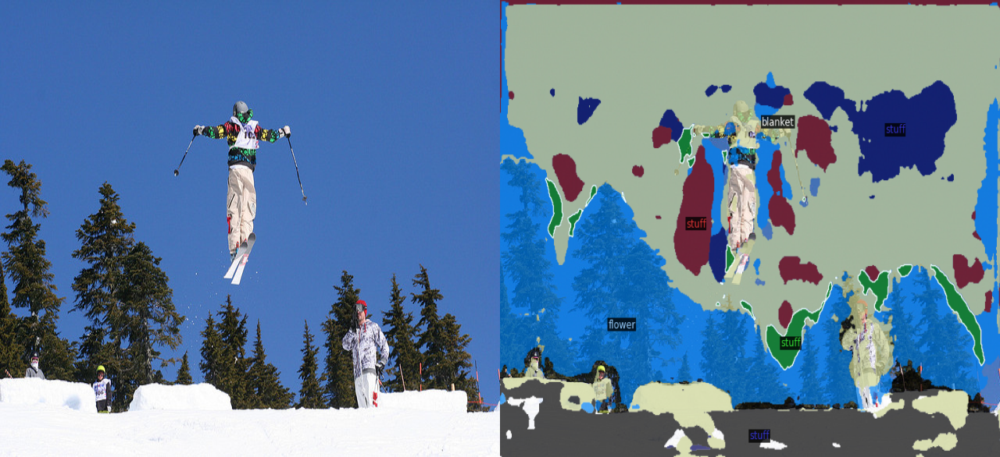

[12/01 17:16:43 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_50_3x/139514569/model_final_c10459.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


CATEGORY_IDX: 71 Metadata(name='coco_val_panoptic_separated', panoptic_root='coco/annotations/panoptic_val2017', image_root='coco/images/val2017', panoptic_json='coco/annotations/panoptic_val2017.json', sem_seg_root='coco/annotations/panoptic_stuff_val2017', json_file='coco/annotations/instances_val2017.json', evaluator_type='coco_panoptic_seg', ignore_label=255, stuff_dataset_id_to_contiguous_id={92: 1, 93: 2, 95: 3, 100: 4, 107: 5, 109: 6, 112: 7, 118: 8, 119: 9, 122: 10, 125: 11, 128: 12, 130: 13, 133: 14, 138: 15, 141: 16, 144: 17, 145: 18, 147: 19, 148: 20, 149: 21, 151: 22, 154: 23, 155: 24, 156: 25, 159: 26, 161: 27, 166: 28, 168: 29, 171: 30, 175: 31, 176: 32, 177: 33, 178: 34, 180: 35, 181: 36, 184: 37, 185: 38, 186: 39, 187: 40, 188: 41, 189: 42, 190: 43, 191: 44, 192: 45, 193: 46, 194: 47, 195: 48, 196: 49, 197: 50, 198: 51, 199: 52, 200: 53, 0: 0}, stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower'

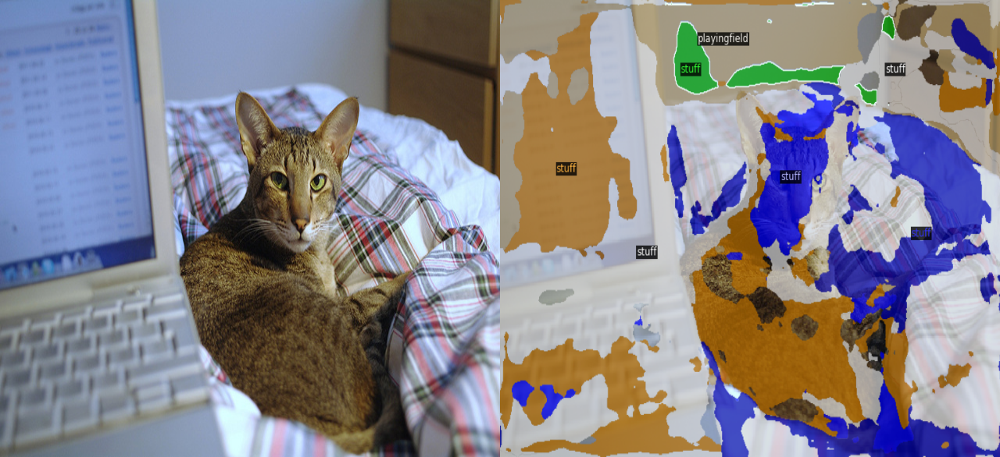

[12/01 17:16:50 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_50_3x/139514569/model_final_c10459.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


CATEGORY_IDX: 92 Metadata(name='coco_val_panoptic_separated', panoptic_root='coco/annotations/panoptic_val2017', image_root='coco/images/val2017', panoptic_json='coco/annotations/panoptic_val2017.json', sem_seg_root='coco/annotations/panoptic_stuff_val2017', json_file='coco/annotations/instances_val2017.json', evaluator_type='coco_panoptic_seg', ignore_label=255, stuff_dataset_id_to_contiguous_id={92: 1, 93: 2, 95: 3, 100: 4, 107: 5, 109: 6, 112: 7, 118: 8, 119: 9, 122: 10, 125: 11, 128: 12, 130: 13, 133: 14, 138: 15, 141: 16, 144: 17, 145: 18, 147: 19, 148: 20, 149: 21, 151: 22, 154: 23, 155: 24, 156: 25, 159: 26, 161: 27, 166: 28, 168: 29, 171: 30, 175: 31, 176: 32, 177: 33, 178: 34, 180: 35, 181: 36, 184: 37, 185: 38, 186: 39, 187: 40, 188: 41, 189: 42, 190: 43, 191: 44, 192: 45, 193: 46, 194: 47, 195: 48, 196: 49, 197: 50, 198: 51, 199: 52, 200: 53, 0: 0}, stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower'

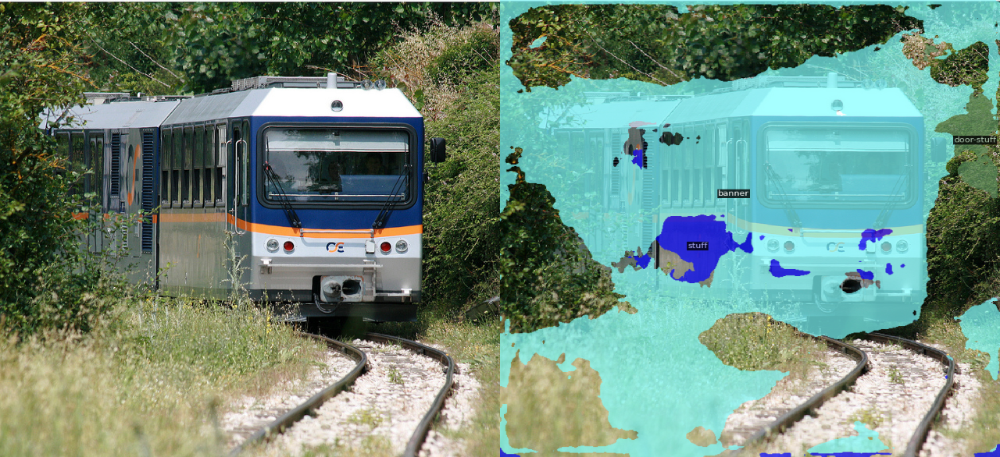

[12/01 17:16:56 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_50_3x/139514569/model_final_c10459.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
sem_seg_head.predictor.{bias, weight}


CATEGORY_IDX: 199 Metadata(name='coco_val_panoptic_separated', panoptic_root='coco/annotations/panoptic_val2017', image_root='coco/images/val2017', panoptic_json='coco/annotations/panoptic_val2017.json', sem_seg_root='coco/annotations/panoptic_stuff_val2017', json_file='coco/annotations/instances_val2017.json', evaluator_type='coco_panoptic_seg', ignore_label=255, stuff_dataset_id_to_contiguous_id={92: 1, 93: 2, 95: 3, 100: 4, 107: 5, 109: 6, 112: 7, 118: 8, 119: 9, 122: 10, 125: 11, 128: 12, 130: 13, 133: 14, 138: 15, 141: 16, 144: 17, 145: 18, 147: 19, 148: 20, 149: 21, 151: 22, 154: 23, 155: 24, 156: 25, 159: 26, 161: 27, 166: 28, 168: 29, 171: 30, 175: 31, 176: 32, 177: 33, 178: 34, 180: 35, 181: 36, 184: 37, 185: 38, 186: 39, 187: 40, 188: 41, 189: 42, 190: 43, 191: 44, 192: 45, 193: 46, 194: 47, 195: 48, 196: 49, 197: 50, 198: 51, 199: 52, 200: 53, 0: 0}, stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower

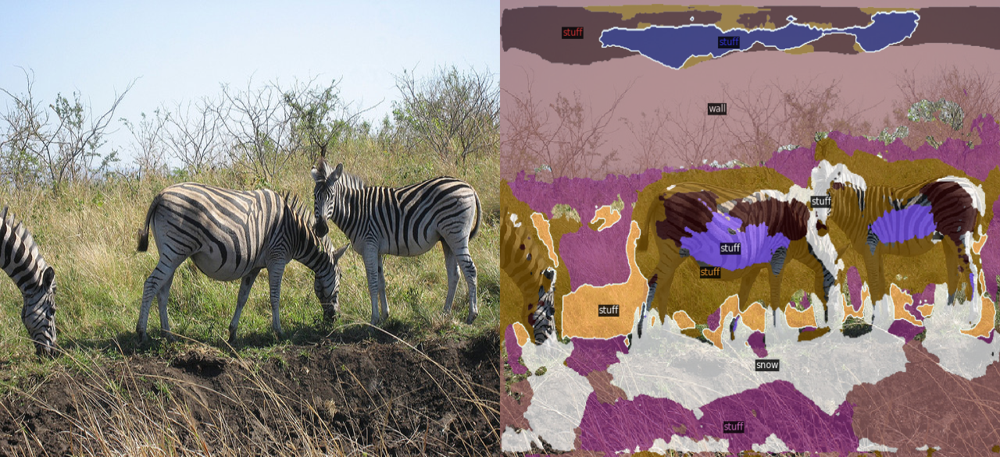

In [149]:
# Test Baseline Model Panoptic Segmentation Predictions
from detectron2.utils.visualizer import Visualizer

def test_prediction(img_file):
  # Test Base Model Prediction
  predictor = DefaultPredictor(cfg)
  sample_img = cv2.imread(img_file)
  outputs = predictor(sample_img)

  # Visualize the results
  v = Visualizer(sample_img, MetadataCatalog.get(cfg.DATASETS.TEST), scale=1.2)
  out = v.draw_panoptic_seg_predictions(outputs["panoptic_seg"][0], outputs["panoptic_seg"][1])

  # Resize images if they have different dimensions
  sample_img = cv2.resize(sample_img, (640, 586))
  sample_pred = cv2.resize(out.get_image(), (640, 586))

  # Concatenate the images horizontally
  horizontal_concat = np.hstack((sample_img, sample_pred))

  # Display the concatenated image
  cv2_imshow(horizontal_concat)

# Test 5 Sample Images
test_prediction("coco/images/val2017/000000000285.jpg")
test_prediction("coco/images/val2017/000000002473.jpg")
test_prediction("coco/images/val2017/000000077595.jpg")
test_prediction("coco/images/val2017/000000039670.jpg")
test_prediction("coco/images/val2017/000000031269.jpg")

In [158]:
from detectron2.engine import DefaultTrainer

# Create a trainer and start training
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [ ]:
'asdf' not in metadata_train

In [ ]:
from detectron2.evaluation import COCOEvaluator
from detectron2.engine import DefaultTrainer

evaluator = COCOEvaluator("coco_val", cfg, False, output_dir="./output/")
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.test(cfg, evaluator)

## Model Evaluation

In [ ]:
# https://cocodataset.org/#panoptic-eval
# import json
# from panopticapi.evaluation import pq_compute

# # ... (Load your predictions in the same format as the COCO annotations)

# # Load ground truth and prediction JSON files
# with open("path/to/ground_truth.json") as f:
#     gt_json = json.load(f)

# with open("path/to/predictions.json") as f:
#     pred_json = json.load(f)

# # Evaluate
# pq_compute(gt_json, pred_json)